# Labolatorium nr 9

#### Patryk Klatka
#### 1 czerwca 2023

Celem tego labolatorium było stworzenie programu obsługującego optyczne rozpoznawanie znaków. W tym celu, do wykrywania jak podobny dany fragment obrazu jest do znaku, została wykorzystana transformata Fouriera. Przed obliczeniem korelacji każdy obraz jest odpowiednio przetwarzany (odwrócenie kolorów, skara szarości).


Sprawozdanie zostało napisane w Jupyter Notebooku, w celu przedstawienia nie tylko wniosków z przeprowadzonego labolatorium, ale również kodu, który został wykorzystany do jego wykonania.

## Import bibliotek oraz ich konfiguracja

In [147]:
import numpy as np
import matplotlib.pyplot as plt
from enum import Enum
from PIL import Image, ImageDraw, ImageFont, ImageOps
from collections import defaultdict, Counter

# Matplotlib settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot')

## Zadanie 1 - Analiza obrazów

W tym zadaniu należało zaimplementować funkcję, która pozwala na analizę obrazów, dokładniej na znajdowaniu wzorca w obrazie. Aby obliczyć korelację między wybranym wzorcem, została wykorzystana transformata Fouriera. Niektóre obrazy były bardzo długo analizowane, więc został zastosowany prosty trick: wartości w pikselach obrazu zostały zmniejszone o odpowiednią liczbę. Dzięki temu, obraz jest analizowany szybciej.

In [148]:
def find_pattern(image_path, pattern_path, min_val_factor=0.5, transform_value=0, show_processed_images=True, plot_correlation=True):
    # Load the image
    image = Image.open(image_path) 
    image_gs = image.convert('L')
    image_iv = ImageOps.invert(image_gs)
    image_transformed = np.swapaxes(np.array(image_iv) - transform_value, 0, 1)

    # Load the pattern
    pattern = Image.open(pattern_path)
    pattern_gs = pattern.convert('L')
    pattern_iv = ImageOps.invert(pattern_gs)
    pattern_transformed = np.swapaxes(np.array(pattern_iv) - transform_value, 0, 1)

    # Do fft2 and show plot of the fazes
    image_fft = np.fft.fft2(image_transformed)
    image_fft_shift_abs = np.abs(image_fft)

    if show_processed_images:
        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(np.swapaxes(np.log(image_fft_shift_abs), 0, 1), cmap='gray')
        plt.title('Amplitude')

        plt.show()

        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(np.swapaxes(np.angle(image_fft), 0, 1), cmap='gray')
        plt.title('Phase')
        plt.show()

        # Show processed images
        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(np.swapaxes(image_transformed, 0, 1), cmap='gray')
        plt.title('Processed image')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(np.swapaxes(pattern_transformed, 0, 1), cmap='gray')
        plt.title('Processed image')
        plt.show()

    
    C = np.real(np.fft.ifft2(np.multiply(image_fft, np.fft.fft2(np.rot90(pattern_transformed, 2), s=image.size))))

    # Plot the correlation

    if plot_correlation:
        plt.plot(C.flatten())
        plt.title('Correlation')
        plt.xlabel('Index')
        plt.ylabel('Value')
        plt.show()

    # Get the minimum value, from which we can say that the pattern is found
    C_min = np.max(C) * min_val_factor

    # Select args where correlation is greater than minimum value
    args = np.argwhere(C >= C_min)  

    occurrences = 0
    for x,y in args:
        for w in range(pattern.size[0]):
            for h in range(pattern.size[1]):
                image.putpixel((x-w, y-h), (255,0,0))
        occurrences += 1

                  
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image, cmap='gray')
    plt.title('Image with pattern')
    plt.show()

    print(f'Pattern occurences: {occurrences}')

### Obraz galia.png

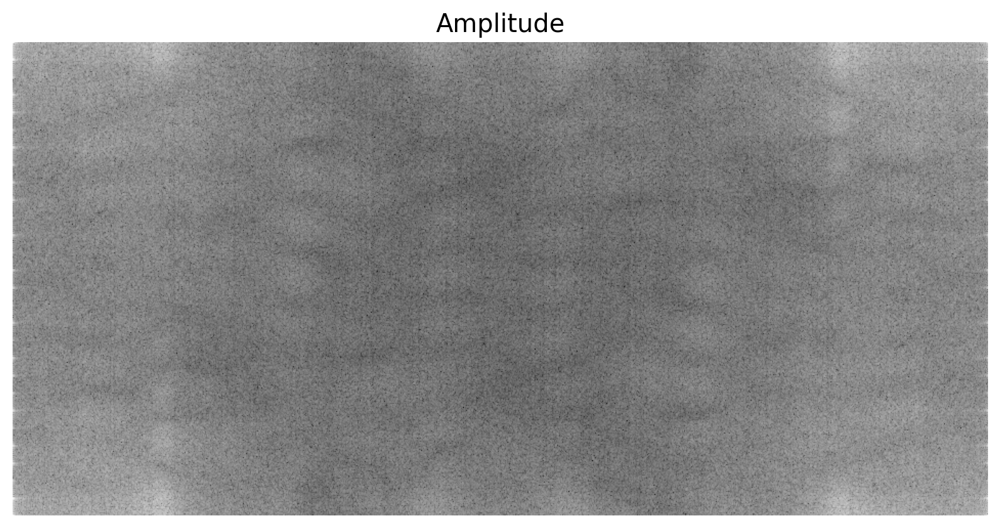

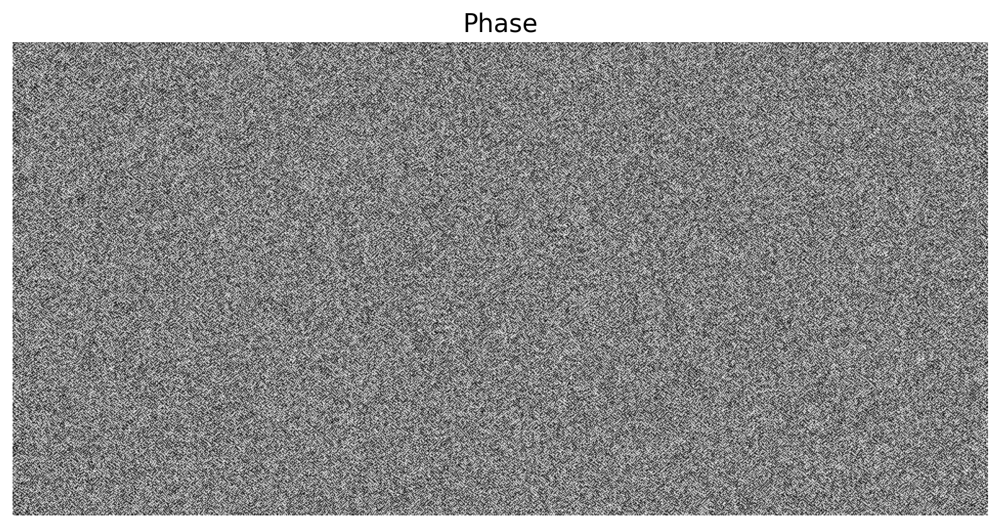

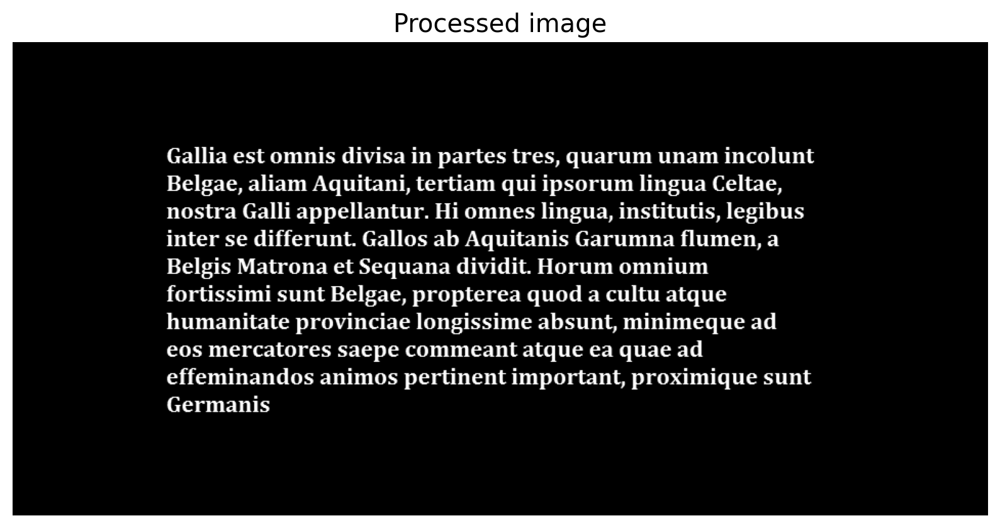

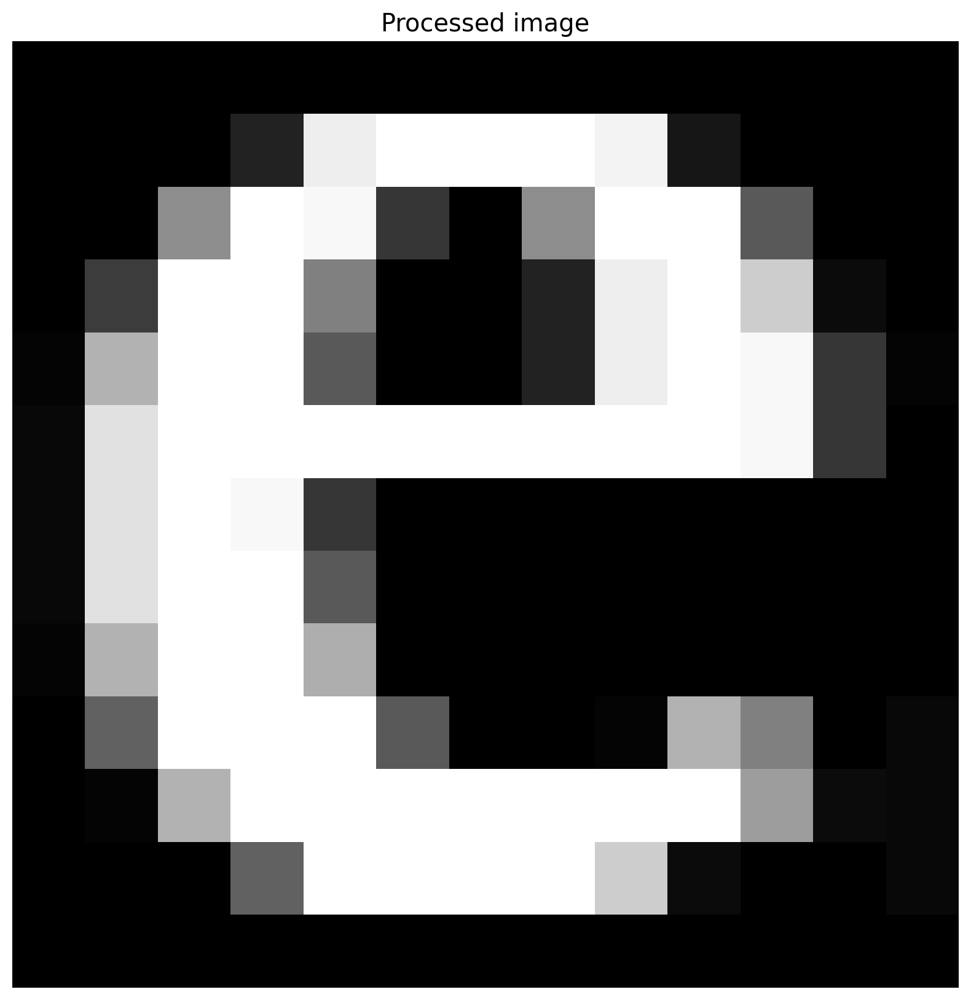

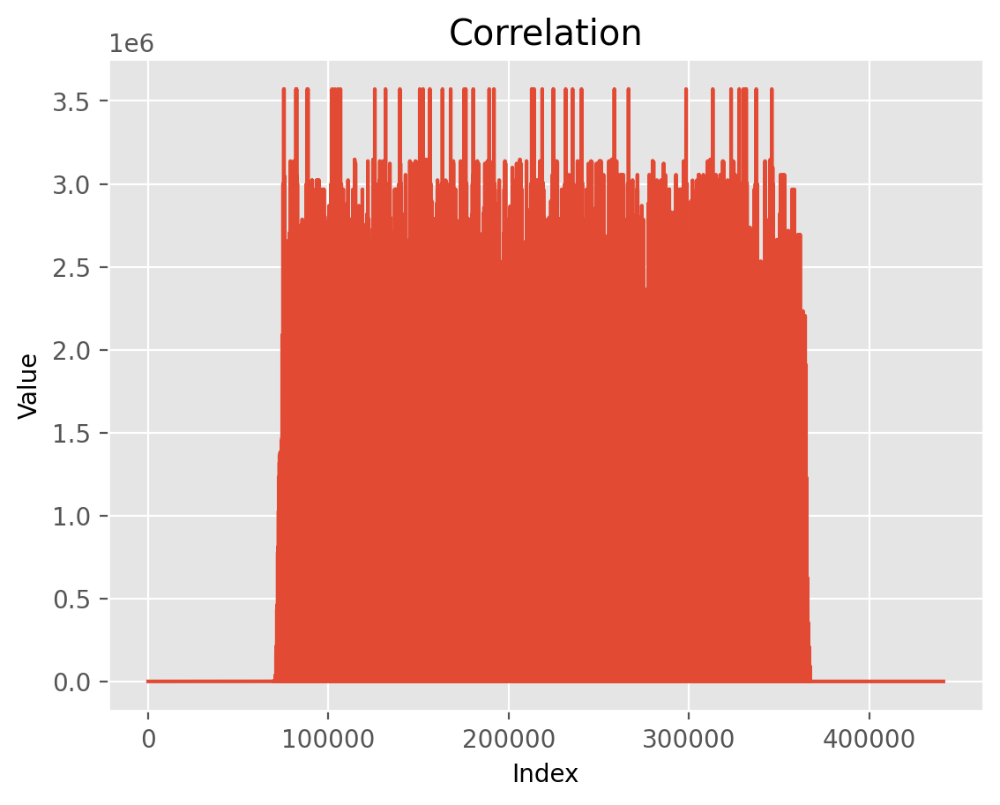

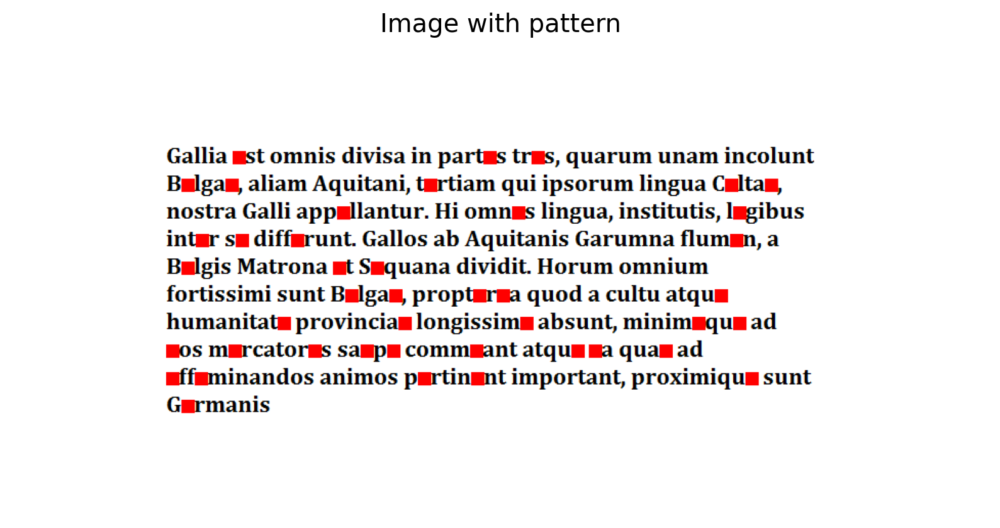

Pattern occurences: 43


In [149]:
find_pattern('./data/galia.png', './data/galia_e.png', transform_value=0, min_val_factor=0.95, show_processed_images=True, plot_correlation=True)

### Obraz school.jpg

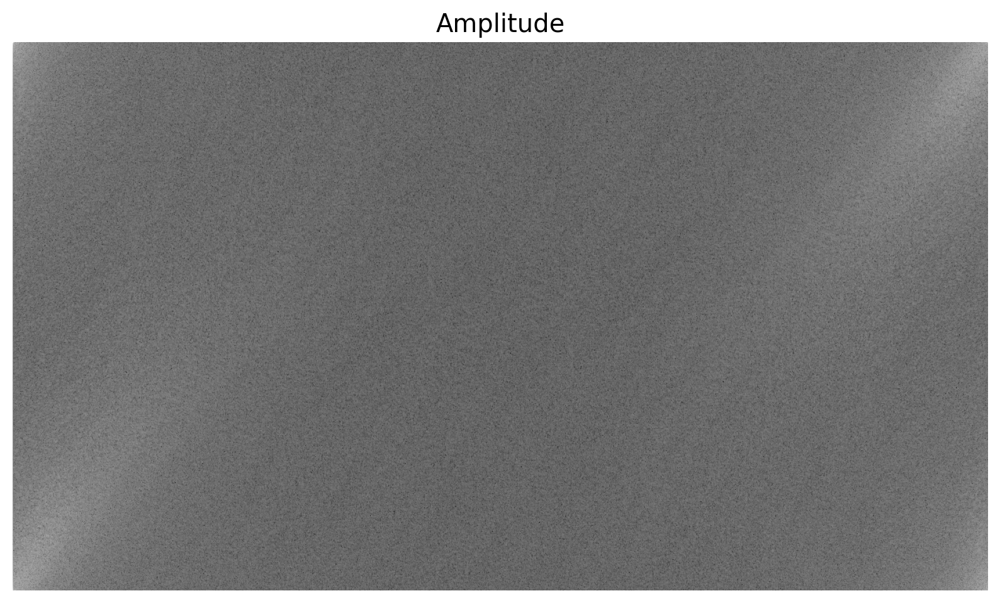

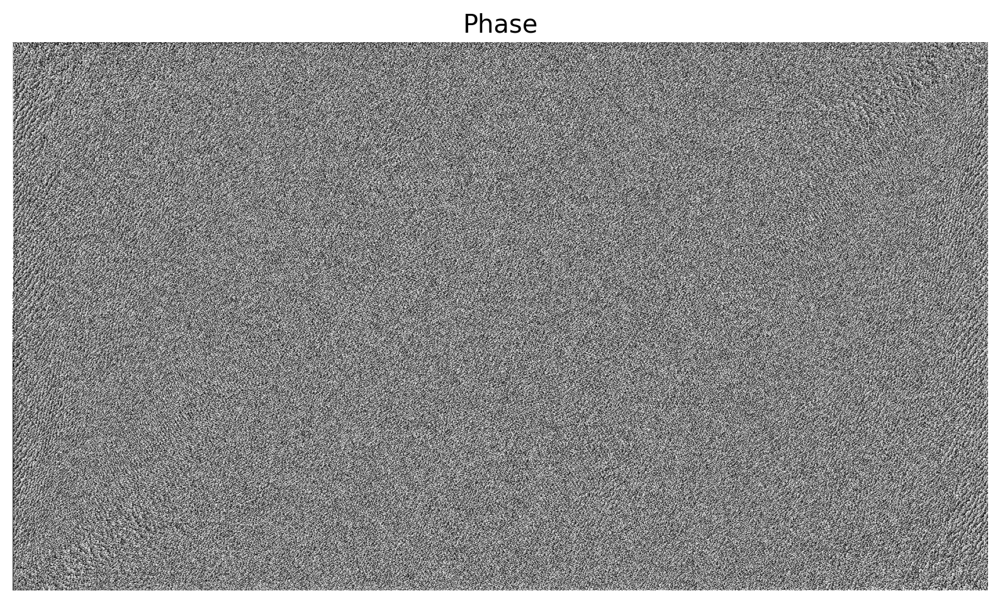

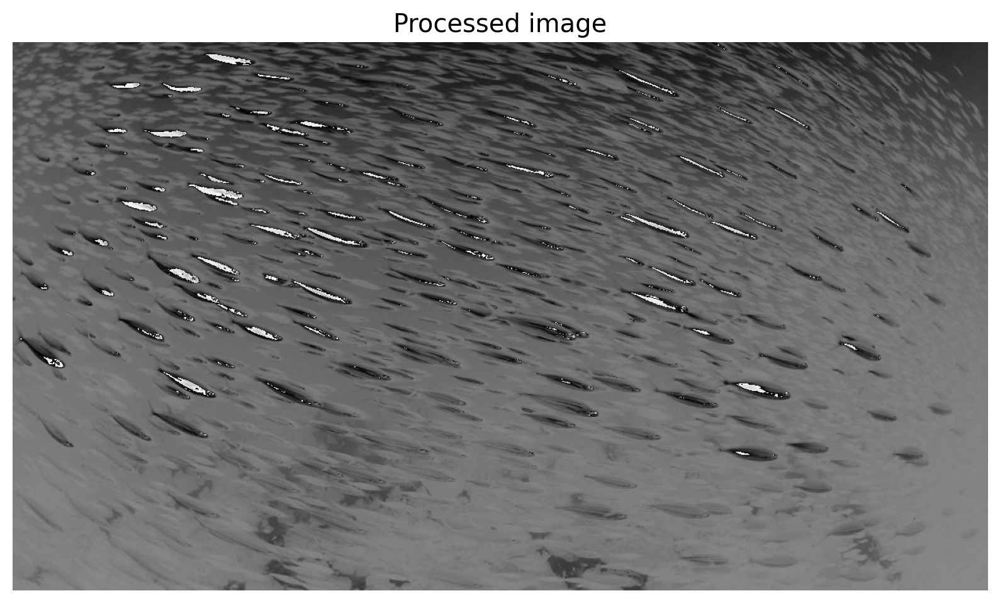

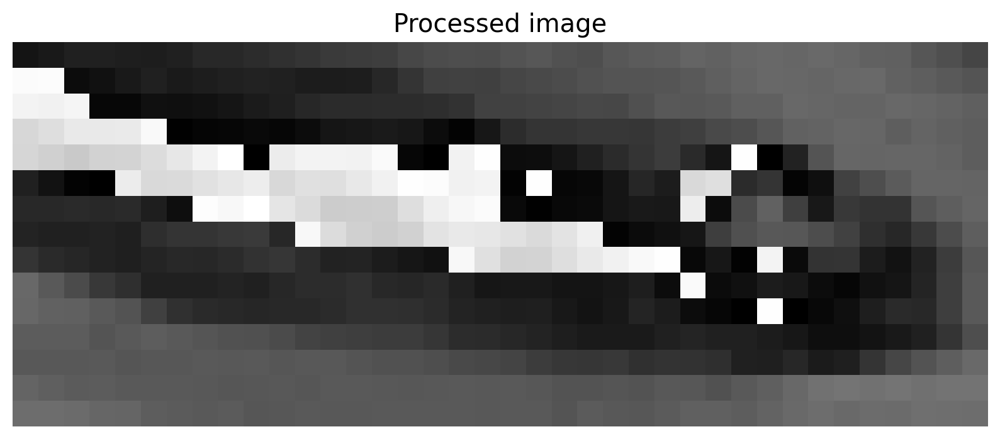

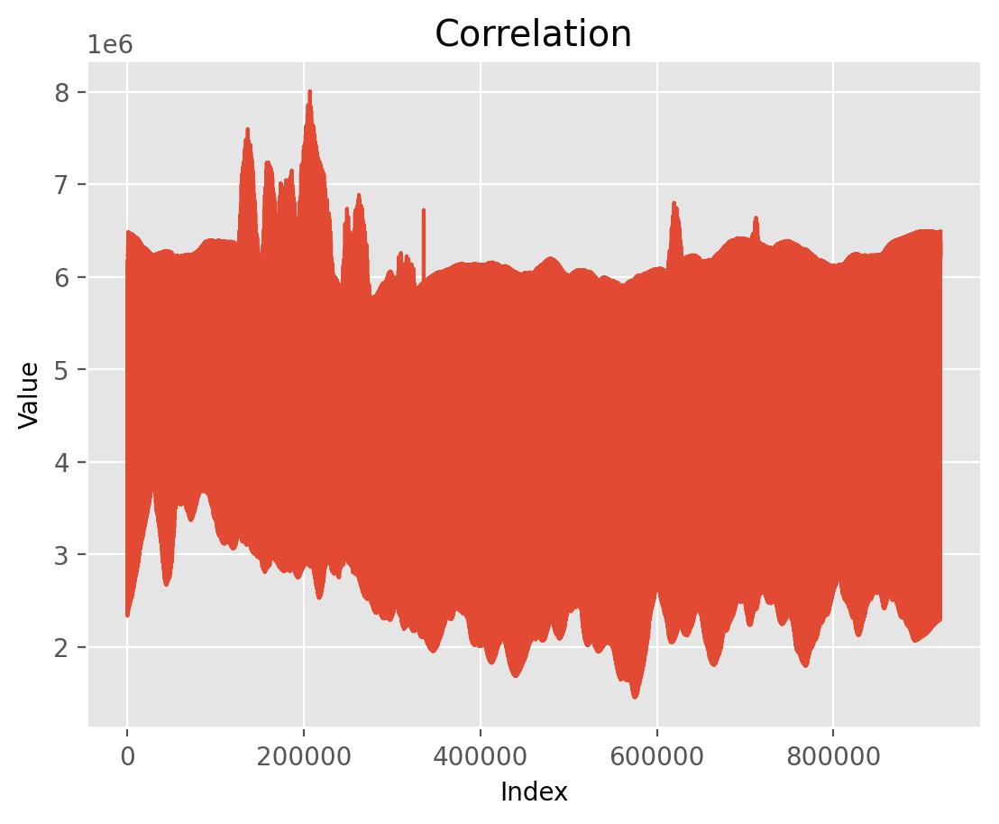

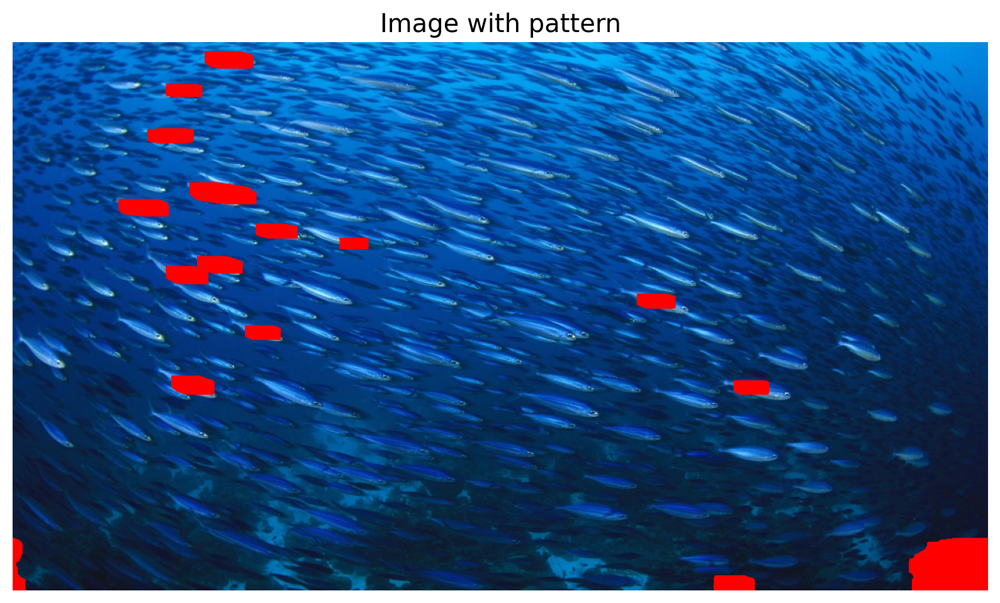

Pattern occurences: 4387


In [150]:
find_pattern('./data/school.jpg', './data/fish1.png', transform_value=100, min_val_factor=0.8, show_processed_images=True, plot_correlation=True)

### Wnioski

Dla obrazu galia.png litera "e" została wykryta prawidłowo. Niestety dla obrazu school.jpg nie zostały wykryte wszystkie wystąpienia wzorca. Modyfikując odpowiednio parametry prawdopodobnie można by było poprawić wyniki, natomiast ciężko byłoby wykryć wszystkie wystąpienia wzorca.

## Zadanie 2 - OCR

Na podstawie poprzedniego zadania, został utworzony program przekształacający obraz w tekst, przyjmując założenia:
1. Na obrazie znajduje się tekst złożony z małych liter alfabetu łacińskiego oraz cyfr
2. Analizowano jeden rozmiar czcionki oraz po jednej czcionce z kategorii serif oraz sans-serif
3. Program zlicza wystąpienia każdej litery oraz cyfry
4. Program raportuje ile znaków zostało rozpoznanych poprawnie, a ile nie

Zasada programu jest podobna do działania programu z poprzedniego zadania. W celu obliczenia korelacji między wzorcem a obrazem wykorzystywana jest transformata Fouriera. W trakcie analizowania wystąpień wzorca (danego znaku) na obrazie, łączone są te same wystąpienia w niewielkich odstępach od siebie i zapisywane. Gdy inna litera zostanie wykryta na już wykrytym obszarze, porównywana jest wartość korelacji i odpowiednio zapisywana jest litera, która ma większą wartość. W trakcie testów, można było zauważyć, że niektóre litery są tak samo rozpoznawane. W tym celu została ustalona pewna kolejność w wykrywaniu liter (kolejność została ustalona na podstawie wyników metody `test_alphabet_classification`). Przykładowo aby wykryć literę "l" dla czcionki Roboto należy wcześniej wykryć litery "b", "d", "h", "k", "4", ponieważ ta litera jest podobna do tych liter ("l" jest pewnego rodzaju podstawą innych liter np. "k" to litera "l", tylko że z dodatkowymi kreseczkami po prawej). Dzięki temu zabiegowi, program działa dokładniej. Dodatkowo, po każdym wykonaniu programu, obliczane jest podobieństwo wykrytego tekstu do oryginału za pomocą odległości Levenshteina.

### Implementacja programu

In [175]:
# Convention: Detect letters dict[x] before you detect letter x
G_for_ROBOTO = {
    'a': [],
    'b': [],
    'c': ['b', 'c', 'd', 'g', 'o','p','q'],
    'd': [],
    'e': [],
    'f': [],
    'g': [],
    'h': [],
    'i': ['b', 'd', 'f', 'h', 'j', 'k', 'l', 'p', 'q', '4'],
    'j': ['g'],
    'k': [],
    'l': ['b', 'd', 'h', 'k', '4'],
    'm': [],
    'n': ['h', 'm'],
    'o': ['b', 'd', 'g', 'p', 'q'],
    'p': ['b'],
    'q': ['g'],
    'r': ['b', 'h', 'm', 'n', 'p'],
    's': [],
    't': ['h'],
    'u': [],
    'v': ['y'],
    'w': [],
    'x': [],
    'y': [],
    'z': [],
    '0': [],
    '1': [],
    '2': [],
    '3': ['8'],
    '4': [],
    '5': [],
    '6': [],
    '7': ['y'],
    '8': [],
    '9': [],
}

G_for_ROBOTO_SLAB = {
    'a': [],
    'b': ['h'],
    'c': ['d', 'e', 'g', 'o', 'p', 'q'],
    'd': [],
    'e': [],
    'f': [],
    'g': [],
    'h': [],
    'i': ['d', 'f', 'h', 'k', 'l', 'p', 'q', '4'],
    'j': ['d', 'g', 'h', 'q', '4'],
    'k': [],
    'l': ['d', 'h', 'k', 'q'],
    'm': [],
    'n': ['h', 'm'],
    'o': ['b', 'd', 'g', 'p', 'q'],
    'p': [],
    'q': [],
    'r': ['h', 'm', 'n'],
    's': [],
    't': ['f'],
    'u': ['d', 'h', 'n', 'n'],
    'v': ['y'],
    'w': [],
    'x': [],
    'y': [],
    'z': [],
    '0': [],
    '1': ['4'],
    '2': [],
    '3': ['5'],
    '4': [],
    '5': [],
    '6': [],
    '7': [],
    '8': [],
    '9': [],
}

def reverse_edges(G):
    G_rev = {}

    for u in G:
        G_rev[u] = []

    for u in G:
        for v in G[u]:
            G_rev[v].append(u)

    return G_rev

def topological_sort(G):
    visited = defaultdict(lambda: False)
    T = []

    def dfs_visit(G,u):
        nonlocal visited, T

        visited[u] = True

        for v in G[u]:
            if not visited[v]:
                dfs_visit(G,v)

        T.insert(0,u)

    for u in G:
        if not visited[u]:
            dfs_visit(G,u)
    
    return ''.join(T)

ALPHABET_ROBOTO = topological_sort(reverse_edges(G_for_ROBOTO)) + '.,?!'
ALPHABET_ROBOTO_SLAB = topological_sort(reverse_edges(G_for_ROBOTO_SLAB)) + '.,?!'

In [176]:
class Font(Enum):
    ROBOTO = ('./fonts/Roboto-Regular.ttf', ALPHABET_ROBOTO)
    ROBOTO_SLAB = ('./fonts/RobotoSlab-Regular.ttf', ALPHABET_ROBOTO_SLAB)

In [177]:
def generate_letter_image(letter, font=Font.ROBOTO, fontsize=25, padding=0):
  image = Image.new("RGB", (fontsize+25, fontsize+25), (255, 255, 255))
  draw = ImageDraw.Draw(image)
  ifont = ImageFont.truetype(font.value[0], fontsize)

  draw.text((padding+5, padding+5), letter, font=ifont, fill=(0,0,0))
  bbox = draw.textbbox((padding+5, padding+5), letter, font=ifont)

  # Add padding to bbox
  bbox = (bbox[0]-padding, bbox[1]-padding, bbox[2]+padding, bbox[3]+padding)

  if letter == ',' or letter == '.':
    l_letter = generate_letter_image('o', font=font, fontsize=fontsize, padding=padding)
    height = l_letter.size[1]
    bbox = (bbox[0], bbox[3] - height, bbox[2], bbox[3])

  # Resize image to bbox
  return image.crop(bbox)

In [178]:
def generate_image_from_text(filepath, imagepath=None, font=Font.ROBOTO, fontsize=25, lower=True):
    ifont = ImageFont.truetype(font.value[0], fontsize)

    # Read the text
    with open(filepath, 'r') as f:
        lines = f.readlines()
        text = ''.join(lines).lower() if lower else ''.join(lines)

        # Get text dimensions
        width = 0
        height = 0
        for line in lines:
            line = line.lower() if lower else line
            left, top, right, bottom = ifont.getbbox(line)
            w = right - left + 5
            h = bottom - top + 10 # Add some space between lines
            width = max(width, w)
            height += h 
            
    # Create the image
    image = Image.new('RGB', (width+10, height+10), color = (255, 255, 255))
    draw = ImageDraw.Draw(image)
    draw.multiline_text((10, 10), text, font=ifont, fill=(0, 0, 0))

    # Save the image
    if imagepath:
        image.save(imagepath)
    else:
        image.save(filepath[:-4] + '.png')

    return image

In [179]:
def ocr(image_path, font=Font.ROBOTO, fontsize=25, min_val_factor=0.95, show_letter_classification=False):
    # Load the image
    image = Image.open(image_path) 
    image_gs = image.convert('L')
    image_iv = ImageOps.invert(image_gs)
    image_transformed = np.swapaxes(np.array(image_iv), 0, 1)

    letter_array = [[('', 0, False, -1) for _ in range(image.size[0])] for _ in range(image.size[1])]
    rgb_diffs = (-50,-80,50)
    letter_counter = Counter()

    # Load the pattern
    detection_id = 0
    for current_char in font.value[1]:
        pattern = generate_letter_image(current_char, font, fontsize)

        # pattern = Image.open(pattern_path)
        pattern_gs = pattern.convert('L')
        pattern_iv = ImageOps.invert(pattern_gs)
        pattern_transformed = np.swapaxes(np.array(pattern_iv), 0, 1)

        # Do fft2 
        image_fft = np.fft.fft2(image_transformed)

        C = np.real(np.fft.ifft2(np.multiply(image_fft, np.fft.fft2(np.rot90(pattern_transformed, 2), s=image.size))))

        # Get the minimum value, from which we can say that the pattern is found
        C_min = np.max(C) * min_val_factor

        # Select args where correlation is greater than minimum value
        args = np.argwhere(C >= C_min)  

        clusters = []
        for x,y in args:
            new_cluster = set()
            for w in range(pattern.size[0]):
                for h in range(pattern.size[1]):
                    new_cluster.add((x-w, y-h))

            # Create intersection if such cluster exist
            rank = C[x][y]
            indices_to_remove = []
            for i, (cluster, cur_rank, repr_point) in enumerate(clusters):
                if len(new_cluster.intersection(cluster)) > 0:
                    new_cluster = new_cluster.union(cluster)
                    indices_to_remove.append(i)

            for j in indices_to_remove:
                if j < len(clusters):
                    del clusters[j]
            
            clusters.append((new_cluster, rank+1, (x,y)))

        letter_counter[current_char] = len(clusters)

        if show_letter_classification:
            print(f'Letter: {current_char}')
            img_cpy = image.copy()
            for cluster, rank, repr_point in clusters:
                for x,y in cluster:
                    r, g, b = img_cpy.getpixel((x, y))
                    img_cpy.putpixel((x, y), (r+rgb_diffs[0], g+rgb_diffs[1], b+rgb_diffs[2]))

            plt.axis('off')
            plt.imshow(img_cpy)
            plt.show()

        for cluster, rank, representative_point in clusters:
            need_swap = False
            all_zeros = True

            min_x = min([x for x,y in cluster])
            max_x = max([x for x,y in cluster])

            mid_x = (min_x + max_x) // 2
            for x,y in cluster:
                if 0 < letter_array[y][x][1] and abs(x - mid_x) < 2:
                    all_zeros = False
                    if rank > letter_array[y][x][1]:
                        need_swap = True
                        old_letter = letter_array[y][x]
                        break
            
            if all_zeros:
                need_swap = True
                old_letter = ('', 0, False)
            else:
                old_letter = ('', 0, False)

            # Swap whole cluster recursively in letter_array
            if need_swap:
                if old_letter[0] != '':
                    stack = [(x,y) for x,y in cluster]
                    while len(stack) > 0:
                        x,y = stack.pop()
                        if 0<=y<len(letter_array) and 0<=x<len(letter_array[y]) and letter_array[y][x] == old_letter:
                            letter_array[y][x] = (current_char, rank, False, detection_id)
                            stack.extend([(x-1,y), (x+1,y), (x,y-1), (x,y+1)])
                else:
                    for x,y in cluster:
                        letter_array[y][x] = (current_char, rank, False, detection_id)
            
            detection_id += 1
                

    for y in range(len(letter_array)):
        for x in range(len(letter_array[y])):
            current_char, rank, visited, detection_id = letter_array[y][x]
            if current_char != '':
                r, g, b = image.getpixel((x, y))
                image.putpixel((x, y), (r+rgb_diffs[0], g+rgb_diffs[1], b+rgb_diffs[2]))
                
    def dfs_visit(x, y):
        nonlocal letter_array
        current_char, rank, visited, detection_id = letter_array[y][x]
        if not visited:
            letter_array[y][x] = (current_char, rank, True, detection_id)
            for dx, dy in [(1,0), (-1,0), (0,1), (0,-1)]:
                if 0 <= x+dx < len(letter_array[y]) and 0 <= y+dy < len(letter_array):
                    if letter_array[y+dy][x+dx][0] == current_char and letter_array[y+dy][x+dx][3] == detection_id:
                        dfs_visit(x+dx, y+dy)

    # TODO: Detect lines and spaces between words
    line_start = 0
    line_height = 30

    if font == Font.ROBOTO:
        line_start = 28
        line_height = 28
    elif font == Font.ROBOTO_SLAB:
        line_start = 30
        line_height = 31

    text = ''
    for y in range(line_start, len(letter_array), line_height):
        for x in range(len(letter_array[y])):
            current_char, rank, visited, detection_id = letter_array[y][x]
            if current_char != '' and not visited:
                dfs_visit(x, y)
                text += current_char
            elif not visited:
                if x > 0 and letter_array[y][x-1][0] != '':
                    text += ' '

            # image.putpixel((x, y), (255,0,0))

        text += '\n'

    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image, cmap='gray')
    plt.title('Image with detected letters')
    plt.show()

    return text.strip(), letter_counter


In [180]:
def test_alphabet_classification(font=Font.ROBOTO, fontsize=25):
    tmp_alphabet = 'abcdefghijklmnopqrstuvwxyz0123456789.,?!'
    generate_image_from_text('./texts/test.txt', font=font, fontsize=fontsize, lower=False)
    ocr('./texts/test.png', font=(font[0], tmp_alphabet), fontsize=25, min_val_factor=0.95, show_letter_classification=True)

In [181]:
def levenshtein(s1, s2):
    # Calculate Levenshtein distance between two strings
    if len(s1) < len(s2):
        return levenshtein(s2, s1)

    if len(s2) == 0:
        return len(s1)

    prev_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        cur_row = [i+1]
        for j, c2 in enumerate(s2):
            insertions = prev_row[j+1] + 1
            deletions = cur_row[j] + 1
            substitutions = prev_row[j] + (c1 != c2)
            cur_row.append(min(insertions, deletions, substitutions))
        prev_row = cur_row
    
    return prev_row[-1]

def calculate_similiarity(detected_text, original_text):
    # Use Levenshtein distance to calculate similarity
    return 1 - (levenshtein(detected_text, original_text) / max(len(detected_text), len(original_text)))

### Ręczna detekcja kolejności wykrywania liter

In [182]:
# test_alphabet_classification(font=Font.ROBOTO, fontsize=25)
# test_alphabet_classification(font=Font.ROBOTO_SLAB, fontsize=25)

### Wygenerowanie obrazów z tekstem

In [183]:
text1 = open('./data/textfiles/text1.txt', 'r').read()
text2 = open('./data/textfiles/text2.txt', 'r').read()
text3 = open('./data/textfiles/text3.txt', 'r').read()

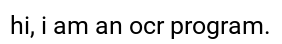

In [184]:
generate_image_from_text('./data/textfiles/text2.txt', imagepath='./data/textfiles/text2_r.png', font=Font.ROBOTO, fontsize=25, lower=True)
generate_image_from_text('./data/textfiles/text3.txt', imagepath='./data/textfiles/text3_r.png', font=Font.ROBOTO, fontsize=25, lower=True)
generate_image_from_text('./data/textfiles/text1.txt', imagepath='./data/textfiles/text1_r.png', font=Font.ROBOTO, fontsize=25, lower=True)

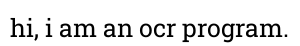

In [185]:
generate_image_from_text('./data/textfiles/text3.txt', imagepath='./data/textfiles/text3_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, lower=True)
generate_image_from_text('./data/textfiles/text2.txt', imagepath='./data/textfiles/text2_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, lower=True)
generate_image_from_text('./data/textfiles/text1.txt', imagepath='./data/textfiles/text1_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, lower=True)

### Czcionka Roboto

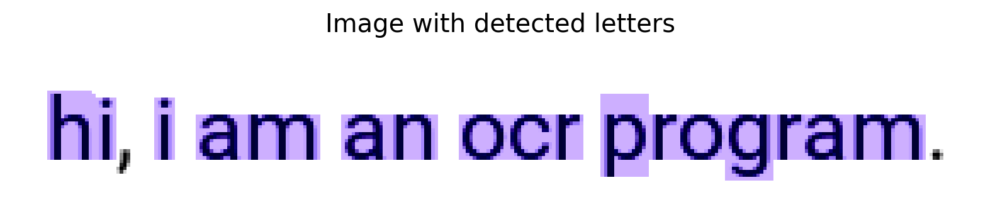

hi i am an ocr program

Similiarity: 68.00%


In [186]:
detected_text, word_detection_count = ocr('./data/textfiles/text1_r.png', font=Font.ROBOTO, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text1)*100:.2f}%')

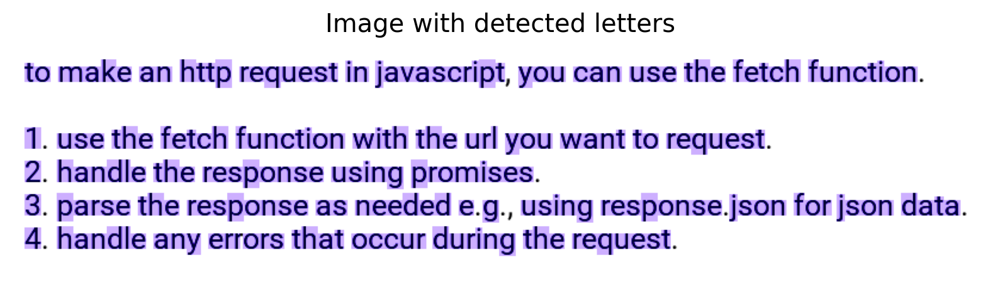

to make an http request in javascript you can use the fetch function 

1 use the fetch function with the url you want to request 
2 handle the response using promises 
3 parse the response as needed e g using response json for json data 
4 handle any en ors that occur during the request

Similiarity: 88.22%


In [187]:
detected_text, word_detection_count = ocr('./data/textfiles/text2_r.png', font=Font.ROBOTO, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text2)*100:.2f}%')

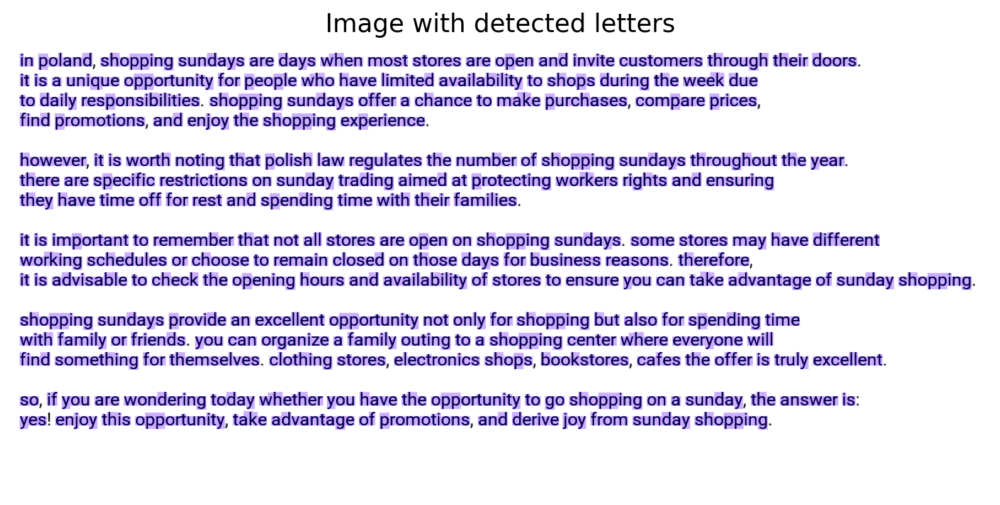

in poland shopping sundays are days when most stores are open and invite customers through their doors 
it is a unique opportunity for people who have limited availability to shops during the week due 
to daily responsibilities shopping sundays offer a chance to make purchases compare prices 
find promotions and enjoy the shopping experience 

however it is worth noting that polish law regulates the number of shopping sundays throughout the year 
there are specific restrictions on sunday trading aimed at protecting wonkers rights and ensuring 
they have time off for rest and spending time with their families 

it is important to remember that not all stores are open on shopping sundays some stores may have different 
wonking schedules or choose to remain closed on those days for business reasons therefore 
it is advisable to check the opening hours and availability of stores to ensure you can take advantage of sunday shopping 

shopping sundays provide an excellent opportunity not only

In [188]:
detected_text, word_detection_count = ocr('./data/textfiles/text3_r.png', font=Font.ROBOTO, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text3)*100:.2f}%')

### Czcionka Roboto Slab

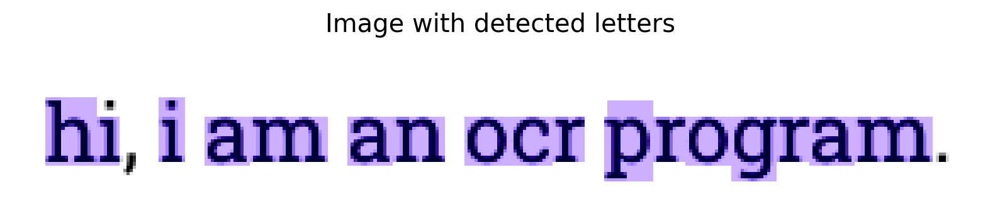

bu i am an ocr program

Similiarity: 64.00%


In [189]:
detected_text, word_detection_count = ocr('./data/textfiles/text1_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text1)*100:.2f}%')

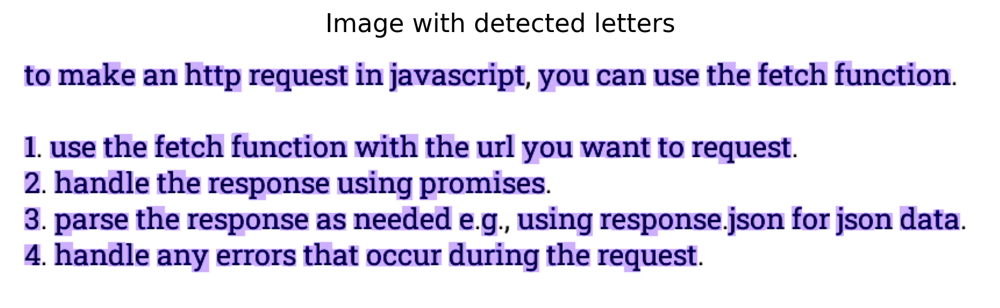

to make an http request in javascript you can use the fetch function 

1 use the fetch function with the url you want to request 
2 hand0 e the response using promises 
3 parse the response as needed e g using response json for json data 
4 hand0 e any errors that occur during the request

Similiarity: 87.54%


In [190]:
detected_text, word_detection_count = ocr('./data/textfiles/text2_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text2)*100:.2f}%')

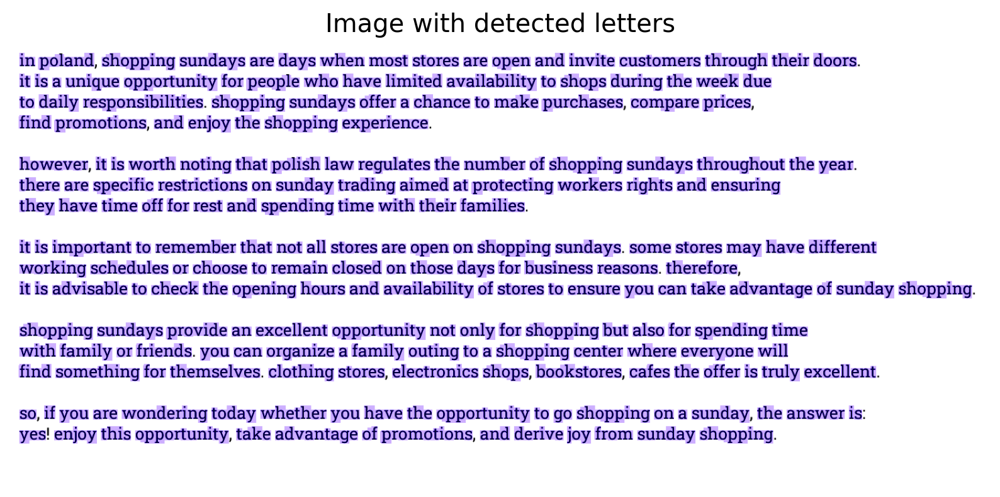

in 1po4and shopping sundays are days when most stores are open and invite customers through their doors 
it is a unique opportunity 1for 1peop4e who have limited availability to shops during the week due 
to daily responsibilities shopping sundays offer a chance to make 1purchases compare 1prices 
1find 1promotions and enjoy the shopping experience 

however it is worth noting that 1po4ish law regulates the number of shopping sundays throughout the year 
there are specific restrictions on sunday trading aimed at 1protecting workers rights and ensuring 
they have time off 1for rest and spending time with their 1families 

it is important to remember that not a 0 stores are open on shopping sundays some stores may have different 
working schedules or choose to remain closed on those days 1for business reasons therefore 
it is advisable to check the opening hours and availability of stores to ensure you can take advantage of sunday shopping 

shopping sundays 1provide an exce 0 ent opport

In [191]:
detected_text, word_detection_count = ocr('./data/textfiles/text3_rs.png', font=Font.ROBOTO_SLAB, fontsize=25, min_val_factor=0.95, show_letter_classification=False)
print(detected_text)
print(f'\nSimiliarity: {calculate_similiarity(detected_text, text3)*100:.2f}%')

### Wnioski

Program dobrze wykrywa tekst na obrazie. Dla czcionki szeryfowej, wykryty tekst miał więcej błędów niż dla czcionki bezszeryfowej. Niestety dla obu czcionek nie zostały wykryte znaki interpunkcyjne. Może być to spowodowane tym, że znaki interpunkcyjne nie brały udziału w preprocessingu kolejności wykrywanych znaków. Po odpowiednim ustaleniu kolejności wykrywania znaków wynik mógłby się poprawić. Pomimo wysokich współczynników podobieństwa tekstów, zwłaszcza dla tekstu nr 3, żaden tekst nie został wykryty w całości poprawnie. 

Program nie został wyposażony w mechanizm automatycznego wykrywania linii oraz rozmiaru czcionki. Dodatkowo nie potrafi rozpoznać czy tekst jest przekrzywiony. Natomiast jest to bardzo proste do zaimplementowania, ponieważ wystarczy wykonać kilka obrotów obrazu (maksymalnie 360) i wykonać analizę dla każdego obrotu. Następnie należy wybrać ten obraz, który ma największą wartość korelacji.